In [1]:
import matplotlib.pyplot as plt
import os
import numpy as np

In [2]:
from mpl_toolkits.mplot3d import Axes3D
import pickle

In [3]:
cd scripts/

/orion/u/ianhuang/superquadric_parsing/scripts


In [4]:
# pair_folder = 'mydecomp2_IOU'
pair_folder = 'mydecomp2_IOU_recenter'
# baseline_folder = 'mydecomp2_IOU_baseline'
baseline_folder = 'mydecomp3_IOU_recenter_baseline'
category_id = '03001627'

From qualitatively inspecting the superquadric decompositions, we've already seen that there's some natural correspondence between parts and superquadrics. Does it do well on quantitative measures?

# How to measure part consistency

For a subset of shapenet models, we have their groundtruth part decompositions. Given a set of decompositions $Q$ for a shape (composed of only superquadrics that make make it past the probability threshold) and a part decomposition $P$, we want to find the best "match" between $Q$ and $P$ to achieve the maximum mean IOU.

Doing this however makes the following assumptions, which may not be true at all. More on this later.
1. Every part should be represented by a single superquadric (This can be violated, by any nonconvex shape considered a single part)
2. Every superquadric can only represent a single part

Furthermore, since IOU is evaluated using point samples and proximity queries, the part meshes need to be watertight. As such, to save compute time, I just use a bounding box to approximate the part mesh. This is a VERY coarse approximation. A beter solution, like approximinating with a convex hull instead, will be used in future iterations.

We would like to measure this consistency by using the Hungarian algorithm to find this matching between $P$ and $Q$ that maximizes the IOU's between superquadrics and parts.

# Visualize the IOU matrices over many parts

In [7]:
models = models_baseline

In [6]:
models_baseline = os.listdir('{}/{}'.format(baseline_folder, category_id))
models_pair = os.listdir('{}/{}'.format(pair_folder, category_id))
models = list(set(models_baseline).union(set(models_pair)))
models_ious = []
for model in models:
    if os.path.exists(os.path.join(baseline_folder, category_id, model)) and \
        os.path.exists(os.path.join(pair_folder, category_id, model)):
        if 'part_IOU.pkl' in os.listdir(os.path.join(baseline_folder, category_id, model)) and \
            'part_IOU.pkl' in os.listdir(os.path.join(pair_folder, category_id, model)):
            models_ious.append(model)
models = models_ious

FileNotFoundError: [Errno 2] No such file or directory: 'mydecomp2_IOU_recenter/03001627'

In [8]:
models

['1e4fb9149de6be81f51f77a6d7299806',
 '5f2441ed2a9ec8fab5d55ded7962c792',
 '5fe9ae9eb1ece960c423490470c47d79',
 '65da0b239837b0f3f3ee5e8ea028d6',
 '7186f1e8dbcb3e8a116162acefe23592',
 '5fe6b79e75130974e8f8c11a24c52ebb',
 '6acb045fe11f7a81f771b7c5ceefa9be',
 '488041c2e021e8e87b11ae648ea92233',
 '72d0cbe861a7de2de4f382dec07f365b',
 '790d554d7f9b040299513f98ce033426',
 '49110d0e41bb90b8b8e1b99345a5afd4',
 '13b6648bdc843b767b5f4d129cc2873d',
 '38201114b7f2c48d6c63709946cf3bde',
 '285931af369b12c2ccd42a2d6eea63ed',
 '397a5fd0a95a17e4dd2be59fe725394a',
 '408631c881e3b33cefb90719a33cc920',
 '68151e7a9fcd8545851e82fe58f53ce1',
 '4f79d43b70f5bca3d082d95e9bd50b49',
 '2ed3b981a9827fb0392642605da2a1e7',
 '2fa970b5c40fbfb95117ae083a7e54ea',
 '1e6f06d182094d4ffebad4f49b26ec52',
 '38afa26a419ea3abed040525648fc6d7',
 '813be9a8485050571563f0911e3e5fc0',
 '5ab321d70991c94d780bc2708a85ba9a',
 '78e1977bc5f0f4041552c6ecbda964b',
 '4edfd09b8d7717cc579600e6ae92ac5e',
 '4960144353a6dd944c5483fab67d9a50',
 '46

SVG path loading unavailable!
Traceback (most recent call last):
  File "/vision/u/ianhuang/anaconda3/envs/superquadrics_bk/lib/python3.7/site-packages/trimesh/path/exchange/svg_io.py", line 18, in <module>
    from svg.path import parse_path
ModuleNotFoundError: No module named 'svg'


{17: 'chair/chair_base/regular_leg_base/leg',
 16: 'chair/chair_base/regular_leg_base/leg',
 15: 'chair/chair_base/regular_leg_base/leg',
 14: 'chair/chair_base/regular_leg_base/leg',
 11: 'chair/chair_seat/seat_frame/seat_holistic_frame',
 9: 'chair/chair_seat/seat_support',
 8: 'chair/chair_seat/seat_surface/seat_single_surface',
 5: 'chair/chair_back/back_surface/back_single_surface',
 3: 'chair/chair_back/back_support',
 2: 'chair/chair_back/back_support',
 20: 'chair/chair_base/regular_leg_base/leg',
 19: 'chair/chair_base/regular_leg_base/leg',
 18: 'chair/chair_base/regular_leg_base/leg',
 10: 'chair/chair_back/back_frame/back_frame_horizontal_bar',
 6: 'chair/chair_back/back_surface/back_surface_horizontal_bar',
 4: 'chair/chair_back/back_surface/back_surface_vertical_bar',
 12: 'chair/chair_seat/seat_support',
 7: 'chair/chair_back/back_surface/back_surface_vertical_bar',
 23: 'chair/chair_base/regular_leg_base/runner',
 22: 'chair/chair_base/regular_leg_base/runner',
 21: 'ch

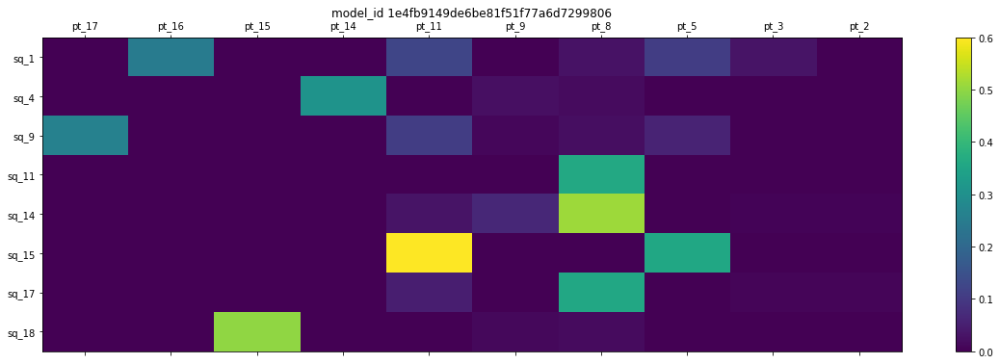

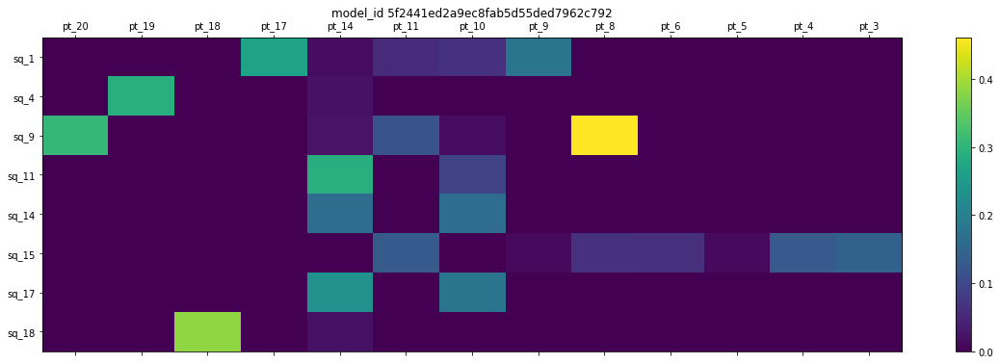

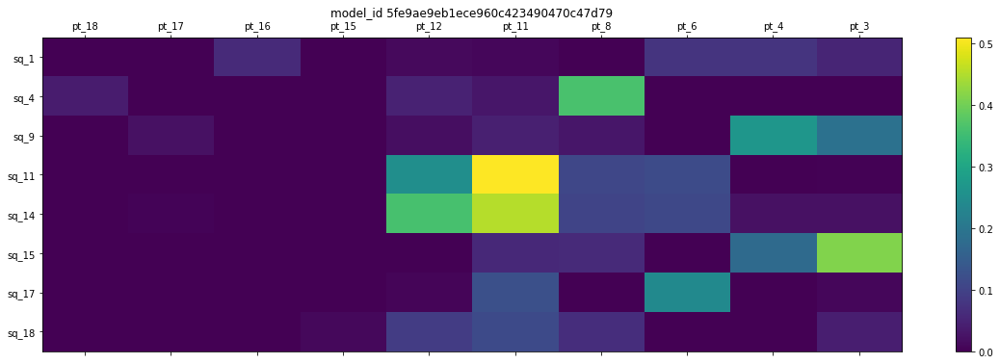

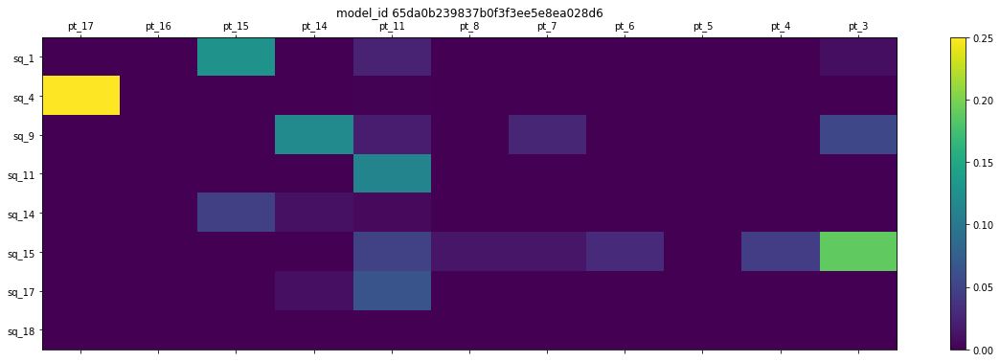

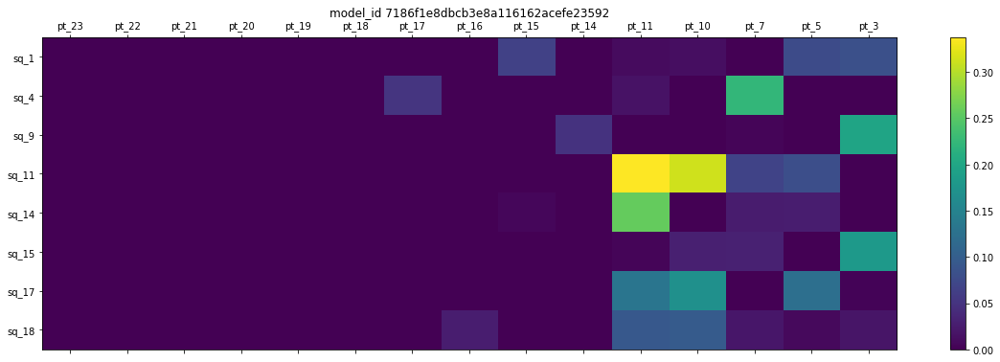

...

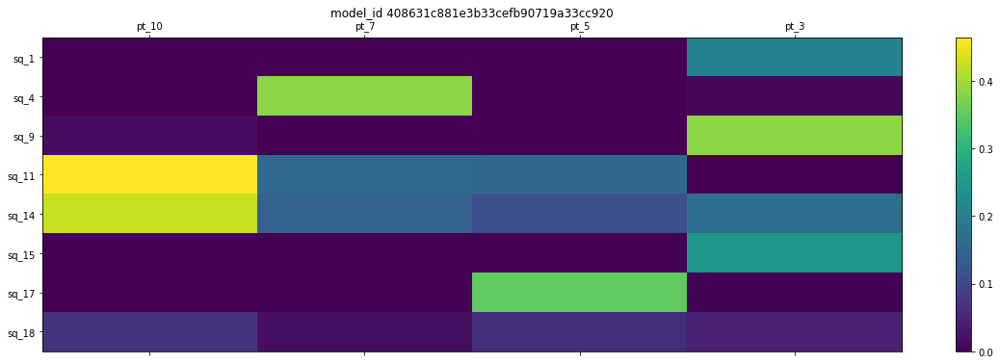

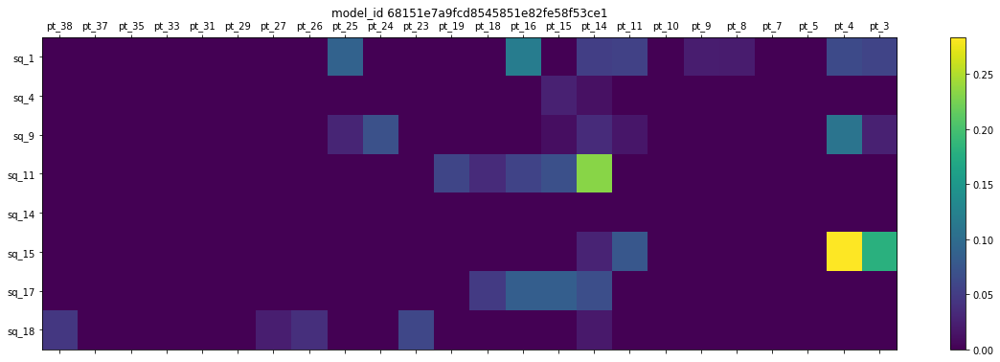

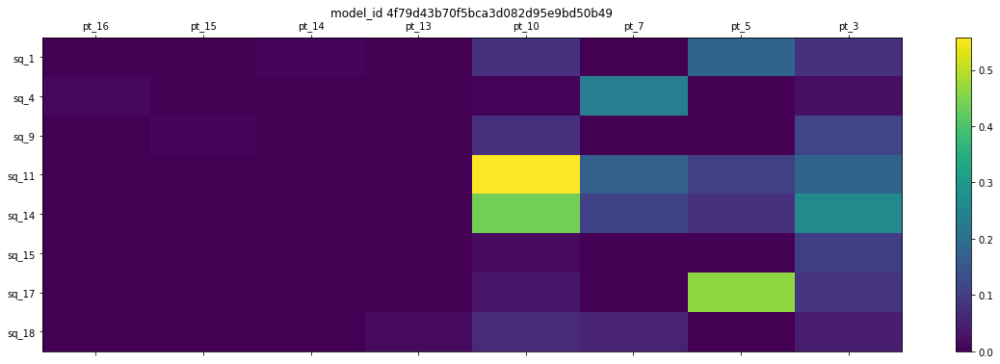

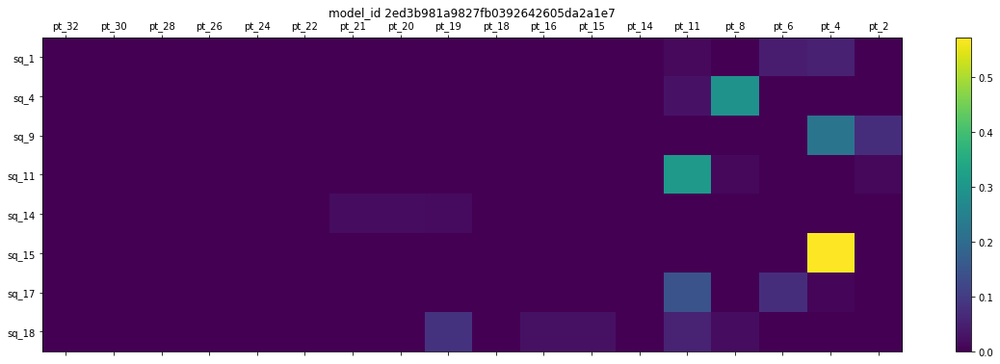

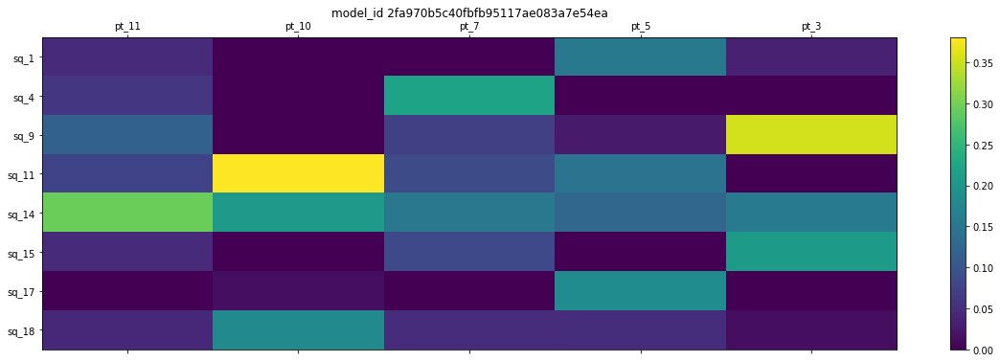

In [9]:

# let's visualize 10
cumulative_id2labels = {}

baseline_supe_part_meshes = []
for model in models[:20]:
    with open(os.path.join(baseline_folder, category_id, model, 'part_IOU.pkl'), 'rb') as f:
        iou_dict = pickle.load(f)
    partids = list(iou_dict['id2labels'].keys())
    idxs = [iou_dict['part_id2idx'][partid] for partid in partids]
    sq_ids_on = [el[0] for el in iou_dict['superquadrics']]

    for id_ in iou_dict['id2labels']:
        if id_ not in cumulative_id2labels:
            cumulative_id2labels[id_] = iou_dict['id2labels'][id_]
    
    fig = plt.figure(figsize=(20, 6))
    ax1 = fig.add_subplot(1,1,1)
    cax = ax1.matshow(iou_dict['indiv_IOU'][sq_ids_on,:][:, idxs], aspect='auto')
    fig.colorbar(cax)
    ax1.set_title('model_id {}'.format(model))
    ax1.set_yticks(list(range(len(sq_ids_on))))
    ax1.set_yticklabels(['sq_{}'.format(id_) for id_ in sq_ids_on])
    ax1.set_xticks(list(range(len(partids))))
    ax1.set_xticklabels(['pt_{}'.format(id_) for id_ in partids])

    superquadric_meshes = iou_dict['superquadrics']
    part_meshes = iou_dict['part_mesh']
    baseline_supe_part_meshes.append({'model': model, 'superquadrics': superquadric_meshes, 'part_meshes': part_meshes})

cumulative_id2labels

Note how in the first ten examples we've seen, superquadrics 1, 2, 3, 4, 5, 9, 11, 14, 15, and 17 are always on, despite there being numerous part changes along the columns.

This suggests that there's potentially some in efficiencies in the allocation of superquadrics. There is also a fair bit of inconsistency in terms of the part that achieves maximum IOU with the same superquadric across different chairs.

See for example what the first superquadric (`sq_1`) overlaps the most with across the different shapes.


In [9]:
all_sq_ids_on

NameError: name 'all_sq_ids_on' is not defined

In [8]:
from tqdm import tqdm

all_sq_ids_on = {}
for model in tqdm(models):
    with open(os.path.join(baseline_folder, category_id, model, 'part_IOU.pkl'), 'rb') as f:
        iou_dict = pickle.load(f)
    partids = list(iou_dict['id2labels'].keys())
    idxs = [iou_dict['part_id2idx'][partid] for partid in partids]
    sq_ids_on = [el[0] for el in iou_dict['superquadrics']]
    if tuple(sq_ids_on) in all_sq_ids_on:
        all_sq_ids_on[tuple(sq_ids_on)] += 1
    else:
        all_sq_ids_on[tuple(sq_ids_on)] = 1



 49%|████▉     | 520/1056 [05:08<05:18,  1.68it/s]


UnpicklingError: invalid load key, '\x00'.

# What if we just look at the labels?

Here are the above plots again, but this time taking the maximium IOU across all parts within a single part label. 

1e4fb9149de6be81f51f77a6d7299806
Pt id's [17, 16, 15, 14] for label chair/chair_base/regular_leg_base/leg
found values [[0.         0.25       0.         0.        ]
 [0.         0.         0.         0.30769231]
 [0.26470588 0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.5        0.        ]]
Pt id's [11] for label chair/chair_seat/seat_frame/seat_holistic_frame
found values [[0.125     ]
 [0.        ]
 [0.10869565]
 [0.        ]
 [0.03111111]
 [0.6       ]
 [0.05102041]
 [0.        ]]
Pt id's [9] for label chair/chair_seat/seat_support
found values [[0.        ]
 [0.02409639]
 [0.00943396]
 [0.        ]
 [0.06756757]
 [0.        ]
 [0.        ]
 [0.01219512]]
Pt id's [8] for label chair/chair_seat/seat_surface/seat_single_surface
found values [[0.02898551]
 [0.01652893]
 [0.02112676]
 [

488041c2e021e8e87b11ae648ea92233
Pt id's [16, 15, 14, 13] for label chair/chair_base/regular_leg_base/leg
found values [[0.         0.1147541  0.         0.        ]
 [0.         0.         0.12820513 0.        ]
 [0.15686275 0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.0106383  0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.2       ]]
Pt id's [10, 9, 8] for label chair/chair_seat/seat_frame/seat_frame_bar
found values [[0.         0.         0.        ]
 [0.         0.         0.        ]
 [0.         0.         0.        ]
 [0.07142857 0.04918033 0.10344828]
 [0.08474576 0.07936508 0.04615385]
 [0.         0.         0.        ]
 [0.         0.         0.04477612]
 [0.         0.06451613 0.        ]]
Pt id's [6] for label chair/chair_seat/seat_surface/seat_single_surface
found values [[0.        ]
 [0.01176471]
 [0.        ]
 [0

{17: 'chair/chair_base/regular_leg_base/leg',
 16: 'chair/chair_base/regular_leg_base/leg',
 15: 'chair/chair_base/regular_leg_base/leg',
 14: 'chair/chair_base/regular_leg_base/leg',
 11: 'chair/chair_seat/seat_support',
 10: 'chair/chair_seat/seat_surface/seat_single_surface',
 7: 'chair/chair_arm/arm_sofa_style',
 5: 'chair/chair_arm/arm_sofa_style',
 3: 'chair/chair_back/back_surface/back_single_surface'}

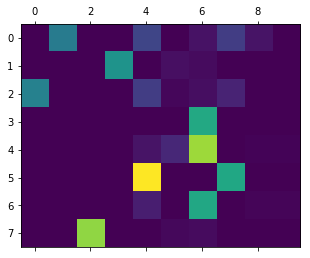

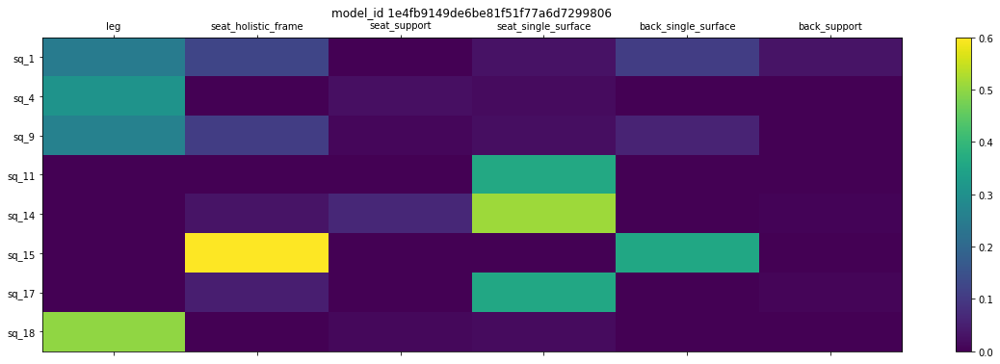

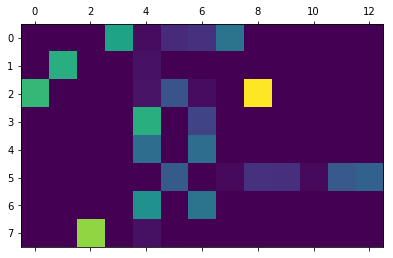

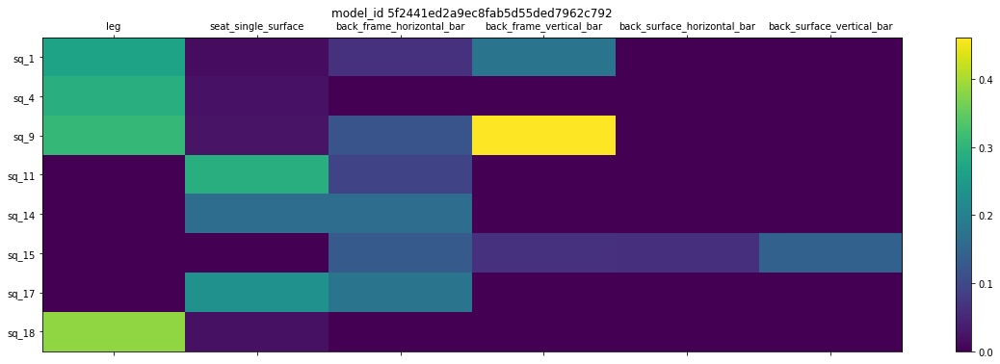

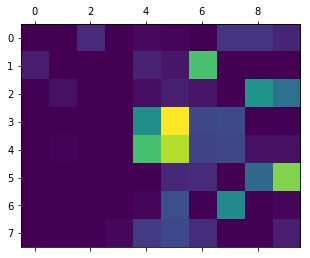

...

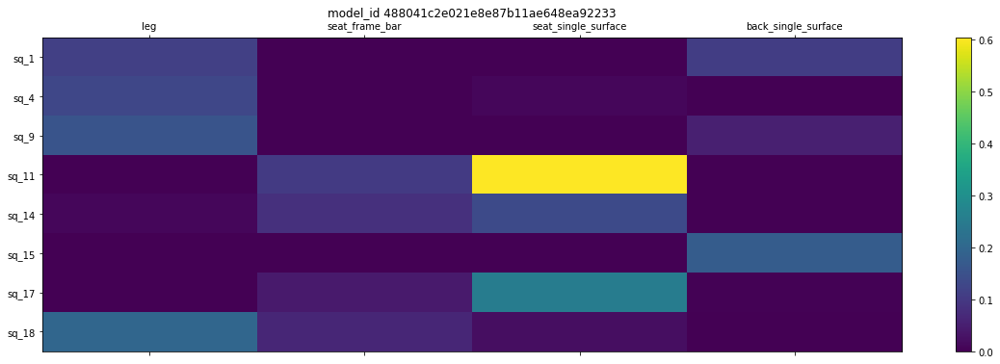

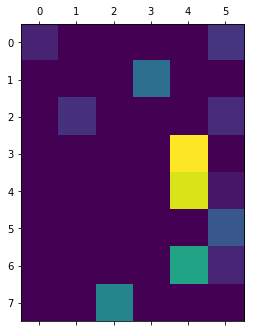

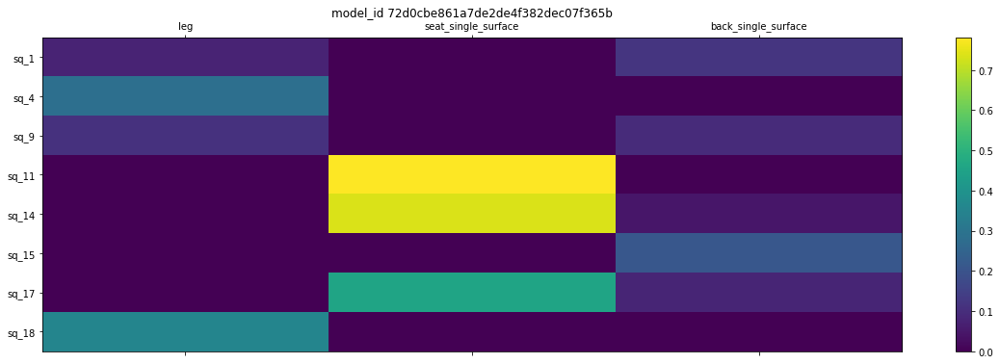

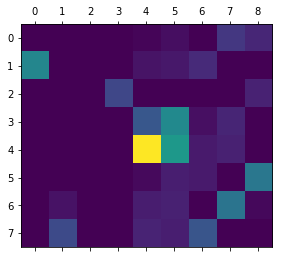

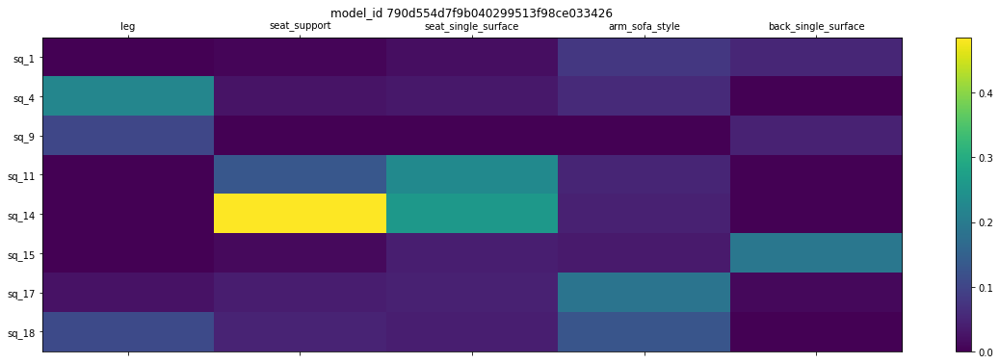

In [10]:
# let's visualize 10


for model in models[:10]:
    print(model)
    with open(os.path.join(baseline_folder, category_id, model, 'part_IOU.pkl'), 'rb') as f:
        iou_dict = pickle.load(f)
    partids = list(iou_dict['id2labels'].keys())
    idxs = [iou_dict['part_id2idx'][partid] for partid in partids]
    sq_ids_on = [el[0] for el in iou_dict['superquadrics']]
    
    cumulative_id2labels = {}
    for id_ in iou_dict['id2labels']:
        if id_ not in cumulative_id2labels:
            cumulative_id2labels[id_] = iou_dict['id2labels'][id_]
    
    
    # just the part_labels
    labels2id = {}
    for id_ in iou_dict['id2labels']:
        label = iou_dict['id2labels'][id_]
        if label not in labels2id:
            labels2id[label] = [id_]
        else:
            labels2id[label].append(id_)
    
    iou_matrix = iou_dict['indiv_IOU']
    iou_matrix = iou_matrix[sq_ids_on, :]
    plt.matshow(iou_matrix[:, idxs])
    
    per_label_maxIOU = []
    labels_per_index = []
    for label in labels2id:
        labels_per_index.append(label)
        print("Pt id's {} for label {}".format(labels2id[label], label))
        print("found values {}".format(iou_matrix[:, [iou_dict['part_id2idx'][el] for el in labels2id[label]  ]  ]))
        per_label_maxIOU.append(np.max(iou_matrix[: , [iou_dict['part_id2idx'][el] for el in labels2id[label]  ]     ], axis=1))
    per_label_maxIOU = np.vstack(per_label_maxIOU).transpose()
    
    fig = plt.figure(figsize=(20, 6))
    ax1 = fig.add_subplot(1,1,1)
    cax = ax1.matshow(per_label_maxIOU, aspect='auto')
    
    
    fig.colorbar(cax)
    ax1.set_title('model_id {}'.format(model))
    ax1.set_yticks(list(range(len(sq_ids_on))))
    ax1.set_yticklabels(['sq_{}'.format(id_) for id_ in sq_ids_on])
    ax1.set_xticks(list(range(len(labels_per_index))))
    ax1.set_xticklabels(['{}'.format(os.path.basename(label)) for label in labels_per_index])

cumulative_id2labels

So it looks like it doens't relaly have part label consistency either...

Let's plot out what it looks like with the bounding boxes and the superquadrics

In [11]:
import trimesh
from trimesh import viewer

def interactive_meshes(supe_part_meshes, index):
    data_dict = supe_part_meshes[index]
    print(data_dict['model'])
        
    superquadric_meshes = data_dict['superquadrics']
    part_meshes = data_dict['part_meshes']
    all_meshes = superquadric_meshes
    all_meshes = [el[1] for el in superquadric_meshes]
    all_meshes += [el[1] for el in part_meshes]
    scene = trimesh.Scene(geometry=all_meshes)
    return scene


def interactive_recenter_meshes(supe_part_meshes, index):
    data_dict = supe_part_meshes[index]
    print(data_dict['model'])
    superquadric_meshes = data_dict['superquadrics']
    part_meshes = data_dict['part_meshes']
    
    
    supe_vert = np.vstack([el[1].vertices for el in superquadric_meshes])
    assert supe_vert.shape[1] == 3
    supe_center = 0.5*(np.max(supe_vert, axis=0) + np.min(supe_vert, axis=0))
    
    part_vert = np.vstack([el[1].vertices for el in part_meshes])
    assert part_vert.shape[1] == 3
    part_center = 0.5*(np.max(part_vert, axis=0) + np.min(part_vert, axis=0))
        
    for el in superquadric_meshes:
        el[1].vertices = el[1].vertices - supe_center + part_center

    all_meshes = superquadric_meshes
    all_meshes = [el[1] for el in superquadric_meshes]
    all_meshes += [el[1] for el in part_meshes]
    scene = trimesh.Scene(geometry=all_meshes)
    return scene


In [14]:
viewer.notebook.scene_to_notebook(interactive_meshes(baseline_supe_part_meshes, 2))

5fe9ae9eb1ece960c423490470c47d79


There seem to be some pretty heavy offsets bteween the bounding box and the superquadrics for some of the samples. This is really weird, as I've made sure that the parts lined up well with the original shapenetV2 models. The only transformation that could have happened is during the voxelation, but that does not seem to be the case. 

# What if we train with pairs?

{13: 'chair/chair_arm/arm_writing_table',
 11: 'chair/chair_arm/arm_sofa_style',
 9: 'chair/chair_back/back_support',
 8: 'chair/chair_back/back_surface/back_single_surface',
 5: 'chair/chair_base',
 4: 'chair/chair_seat/seat_support',
 3: 'chair/chair_seat/seat_surface/seat_single_surface',
 16: 'chair/chair_base/regular_leg_base/leg',
 15: 'chair/chair_base/regular_leg_base/leg',
 14: 'chair/chair_base/regular_leg_base/leg',
 10: 'chair/chair_seat/seat_surface/seat_single_surface',
 7: 'chair/chair_arm/arm_sofa_style',
 24: 'chair/chair_base/regular_leg_base/leg',
 23: 'chair/chair_base/regular_leg_base/leg',
 22: 'chair/chair_base/regular_leg_base/leg',
 21: 'chair/chair_base/regular_leg_base/leg',
 18: 'chair/chair_seat/seat_support',
 17: 'chair/chair_seat/seat_frame/seat_frame_bar',
 6: 'chair/chair_arm/arm_near_vertical_bar',
 27: 'chair/chair_arm/arm_horizontal_bar',
 26: 'chair/chair_arm/arm_near_vertical_bar',
 34: 'chair/chair_base/regular_leg_base/foot',
 33: 'chair/chair_b

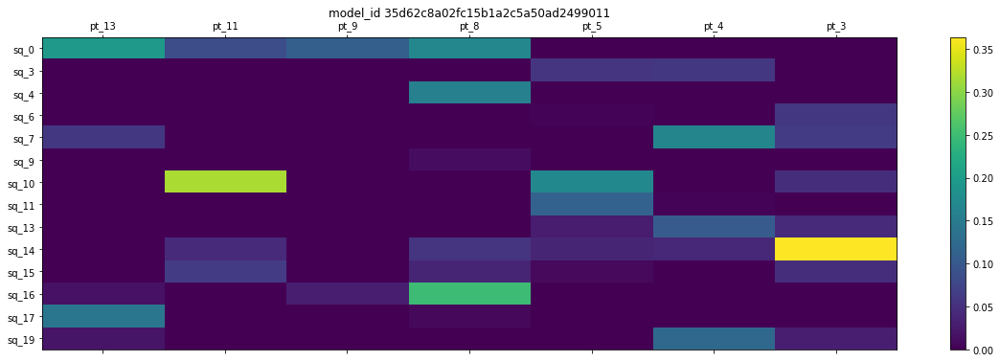

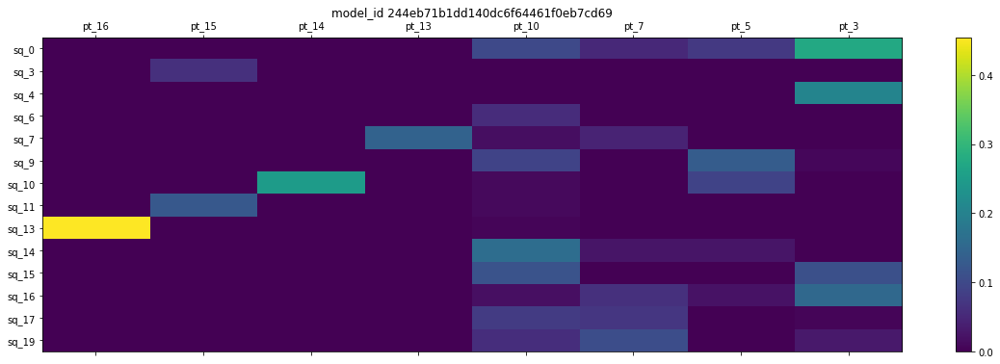

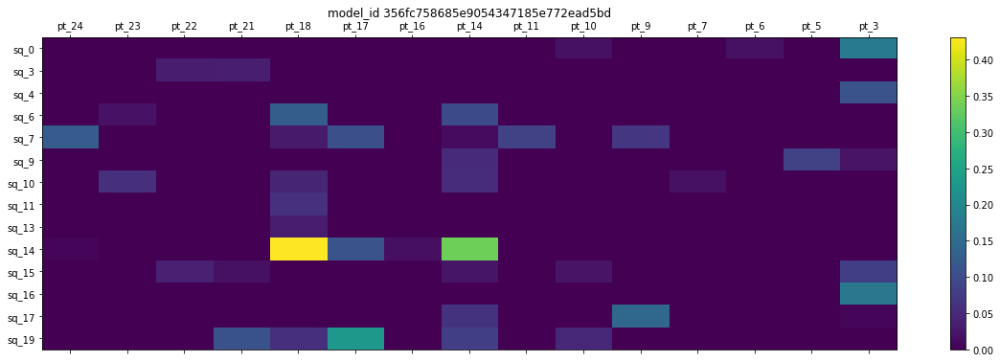

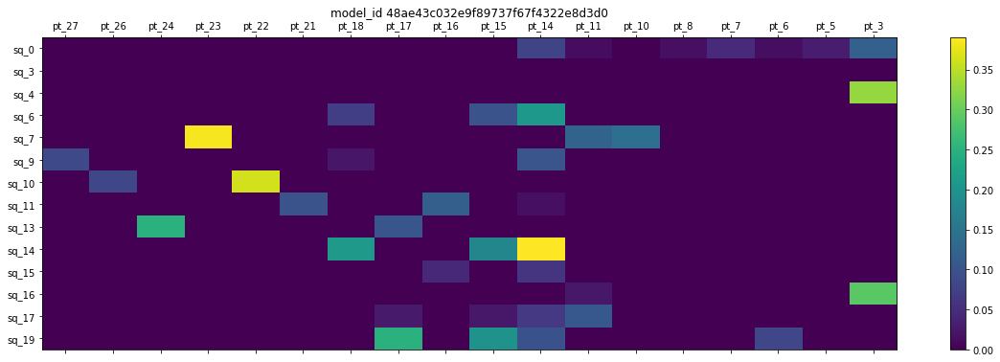

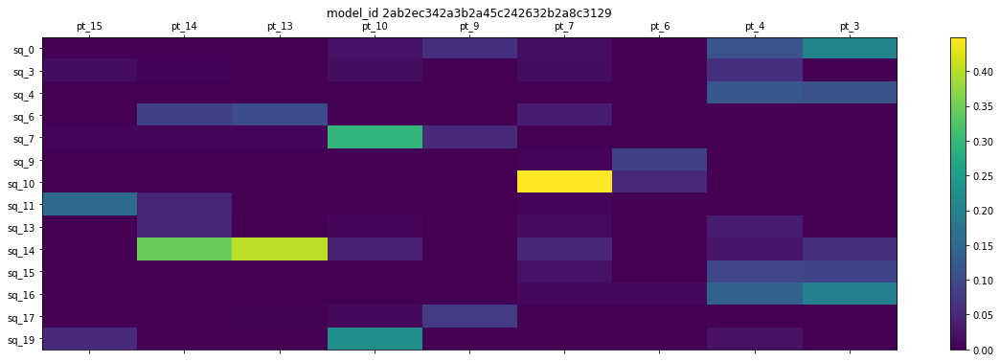

...

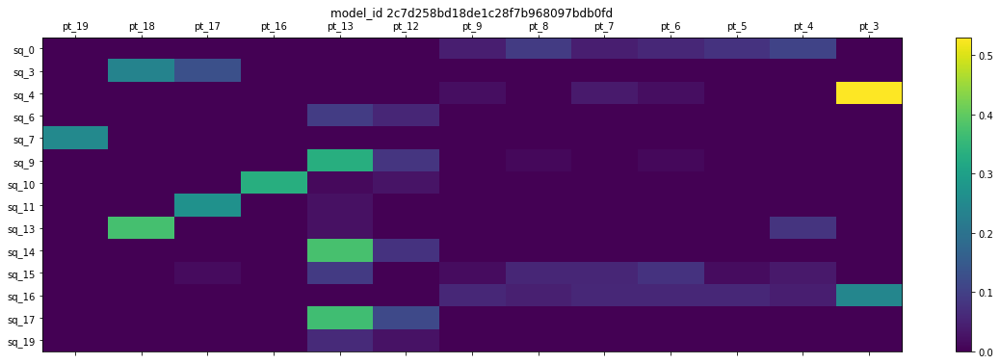

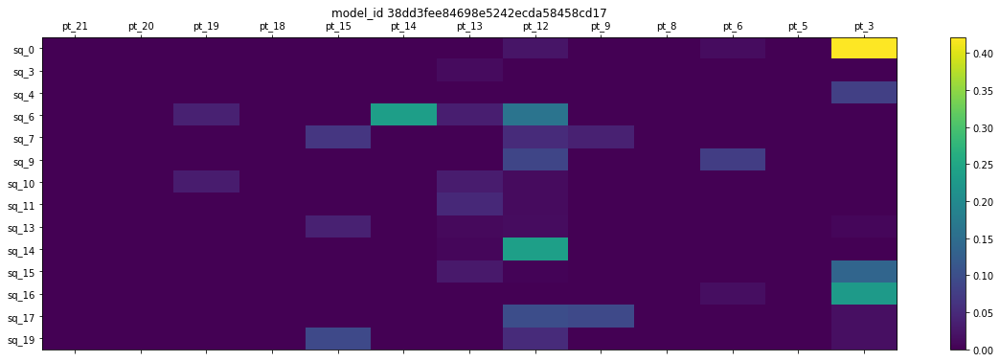

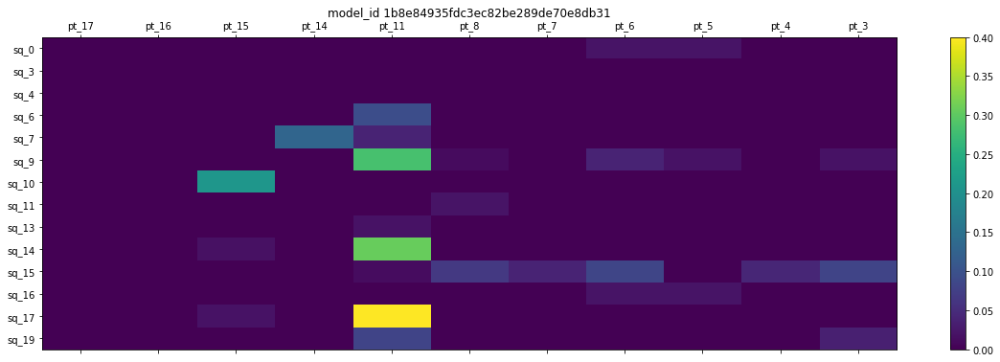

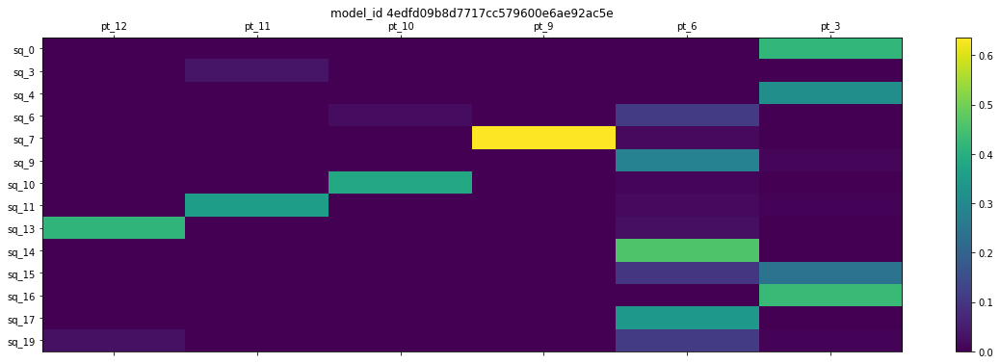

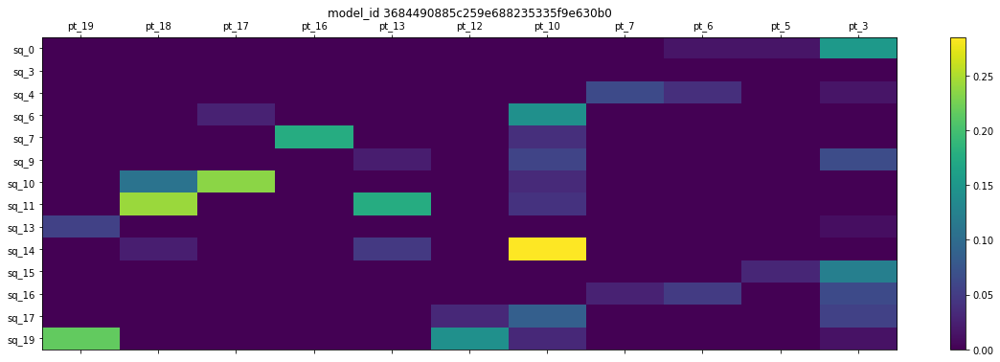

In [12]:

# let's visualize 10
cumulative_id2labels = {}

pair_supe_part_meshes = []
for model in models[:20]:
    with open(os.path.join(pair_folder, category_id, model, 'part_IOU.pkl'), 'rb') as f:
        iou_dict = pickle.load(f)
    partids = list(iou_dict['id2labels'].keys())
    idxs = [iou_dict['part_id2idx'][partid] for partid in partids]
    sq_ids_on = [el[0] for el in iou_dict['superquadrics']]

    for id_ in iou_dict['id2labels']:
        if id_ not in cumulative_id2labels:
            cumulative_id2labels[id_] = iou_dict['id2labels'][id_]
    
    fig = plt.figure(figsize=(20, 6))
    ax1 = fig.add_subplot(1,1,1)
    cax = ax1.matshow(iou_dict['indiv_IOU'][sq_ids_on,:][:, idxs], aspect='auto')
    fig.colorbar(cax)
    ax1.set_title('model_id {}'.format(model))
    ax1.set_yticks(list(range(len(sq_ids_on))))
    ax1.set_yticklabels(['sq_{}'.format(id_) for id_ in sq_ids_on])
    ax1.set_xticks(list(range(len(partids))))
    ax1.set_xticklabels(['pt_{}'.format(id_) for id_ in partids])

    superquadric_meshes = iou_dict['superquadrics']
    part_meshes = iou_dict['part_mesh']
    pair_supe_part_meshes.append({'model': model, 'superquadrics': superquadric_meshes, 'part_meshes': part_meshes})

cumulative_id2labels

Looks like the issue with inefficient allocation still exists.

{13: 'chair/chair_arm/arm_writing_table',
 11: 'chair/chair_arm/arm_sofa_style',
 9: 'chair/chair_back/back_support',
 8: 'chair/chair_back/back_surface/back_single_surface',
 5: 'chair/chair_base',
 4: 'chair/chair_seat/seat_support',
 3: 'chair/chair_seat/seat_surface/seat_single_surface',
 16: 'chair/chair_base/regular_leg_base/leg',
 15: 'chair/chair_base/regular_leg_base/leg',
 14: 'chair/chair_base/regular_leg_base/leg',
 10: 'chair/chair_seat/seat_surface/seat_single_surface',
 7: 'chair/chair_arm/arm_sofa_style',
 24: 'chair/chair_base/regular_leg_base/leg',
 23: 'chair/chair_base/regular_leg_base/leg',
 22: 'chair/chair_base/regular_leg_base/leg',
 21: 'chair/chair_base/regular_leg_base/leg',
 18: 'chair/chair_seat/seat_support',
 17: 'chair/chair_seat/seat_frame/seat_frame_bar',
 6: 'chair/chair_arm/arm_near_vertical_bar',
 27: 'chair/chair_arm/arm_horizontal_bar',
 26: 'chair/chair_arm/arm_near_vertical_bar',
 34: 'chair/chair_base/regular_leg_base/foot',
 33: 'chair/chair_b

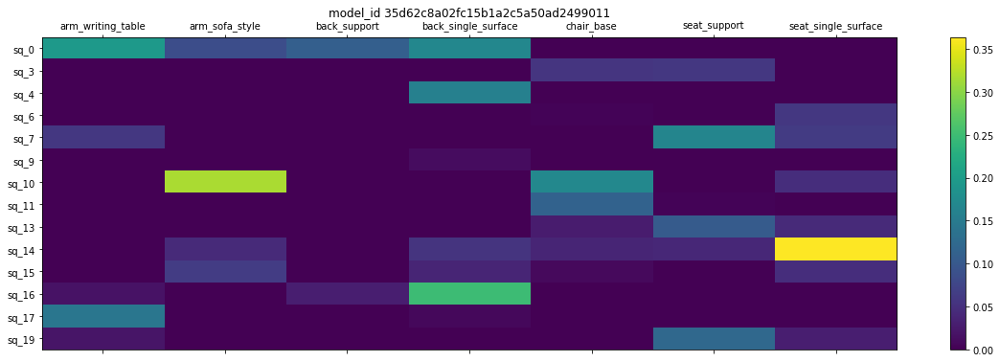

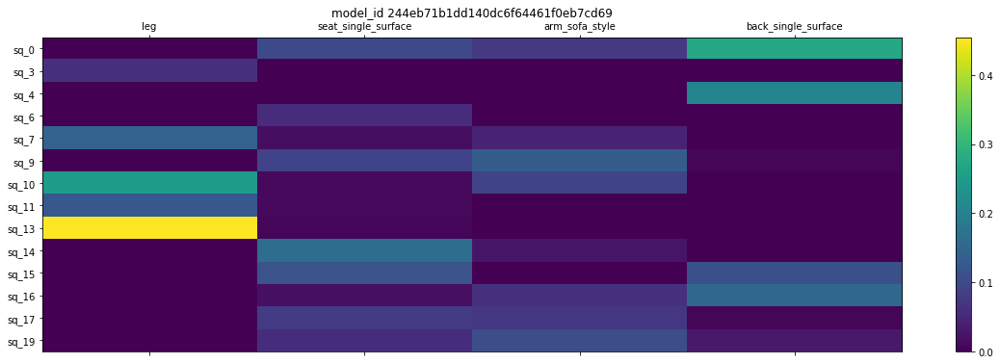

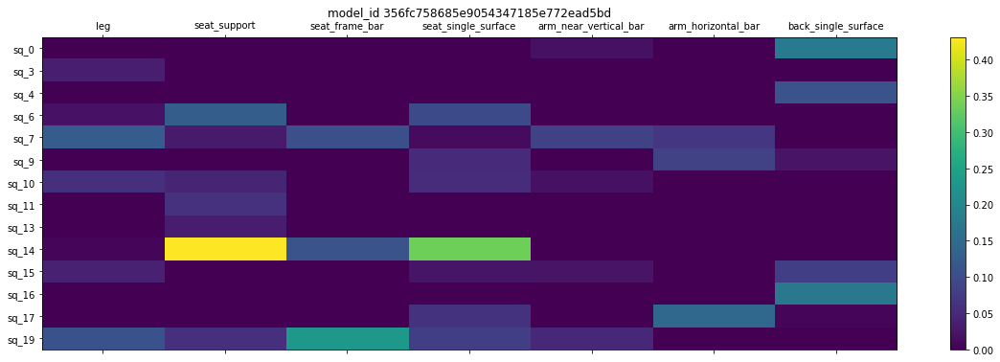

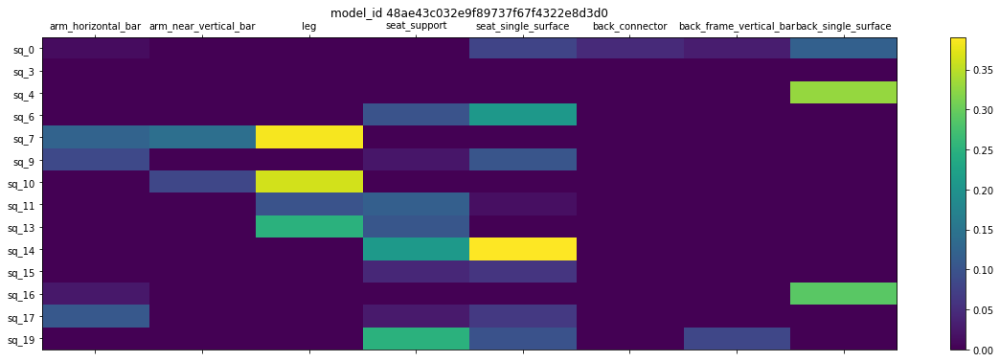

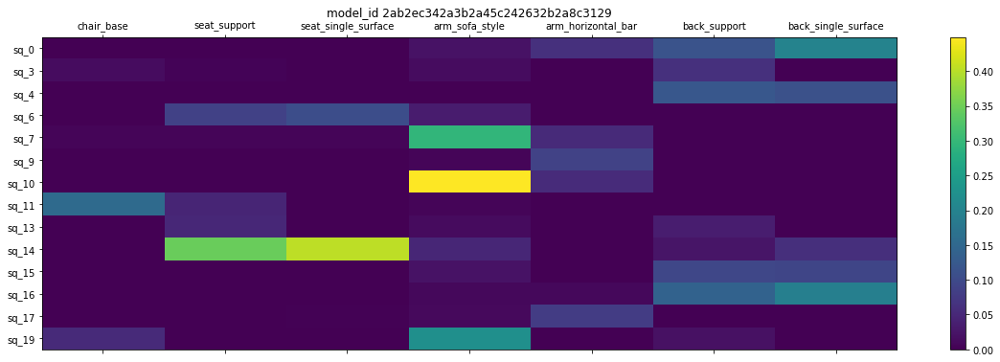

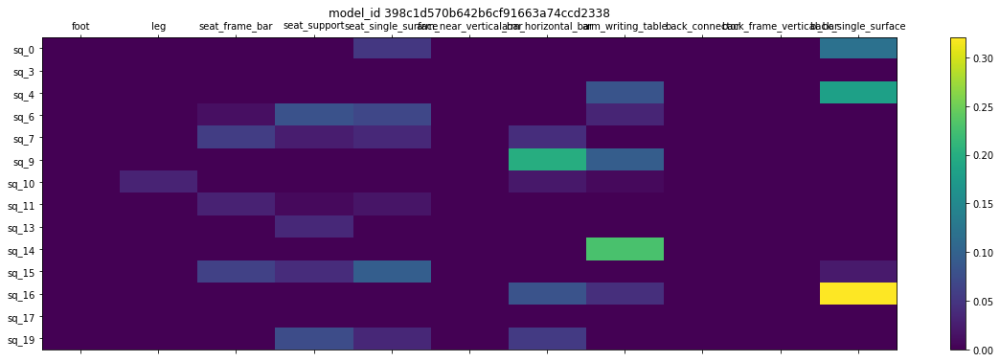

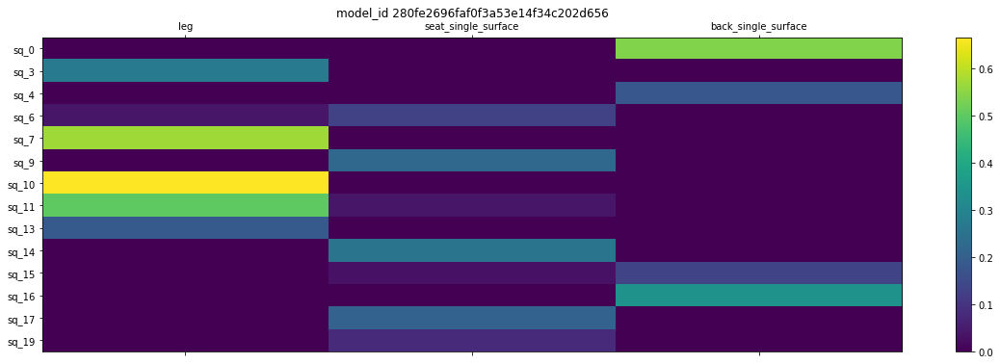

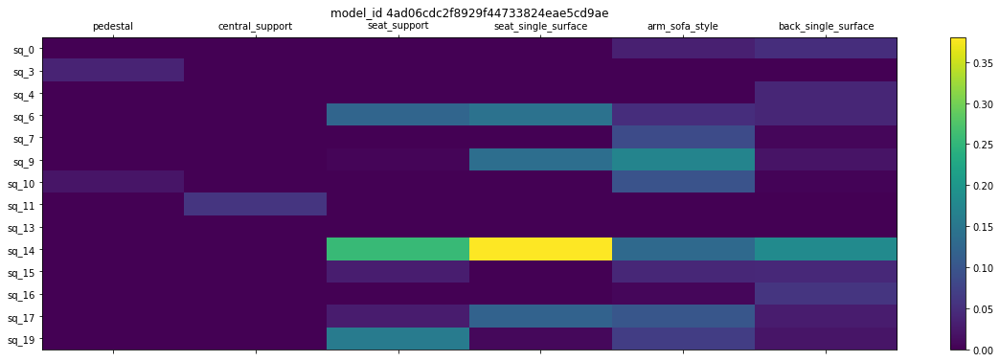

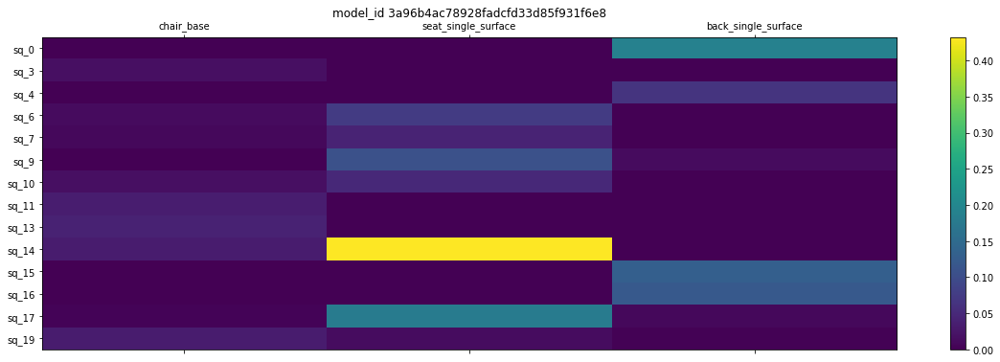

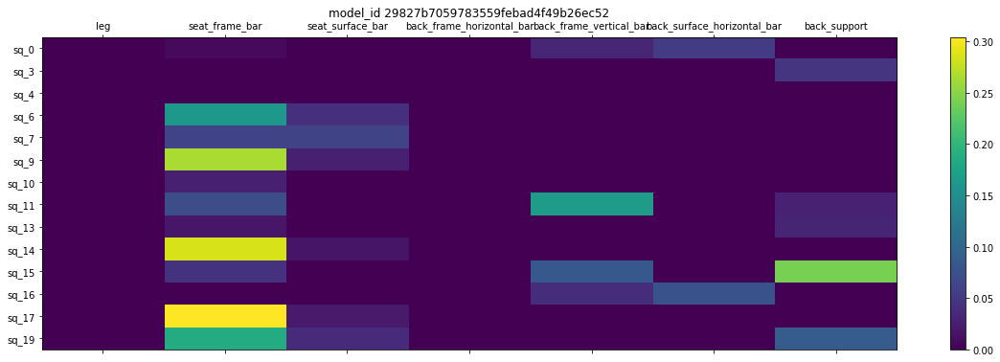

In [59]:
# let's visualize 10
cumulative_id2labels = {}

for model in models[:10]:
    with open(os.path.join(pair_folder, category_id, model, 'part_IOU.pkl'), 'rb') as f:
        iou_dict = pickle.load(f)
    partids = list(iou_dict['id2labels'].keys())
    idxs = [iou_dict['part_id2idx'][partid] for partid in partids]
    sq_ids_on = [el[0] for el in iou_dict['superquadrics']]

    for id_ in iou_dict['id2labels']:
        if id_ not in cumulative_id2labels:
            cumulative_id2labels[id_] = iou_dict['id2labels'][id_]
    
    
    # just the part_labels
    labels2id = {}
    for id_ in iou_dict['id2labels']:
        label = iou_dict['id2labels'][id_]
        if label not in labels2id:
            labels2id[label] = [id_]
        else:
            labels2id[label].append(id_)
    
    iou_matrix = iou_dict['indiv_IOU']
    iou_matrix = iou_matrix[sq_ids_on, :]
    per_label_maxIOU = []
    labels_per_index = []
    for label in labels2id:
        labels_per_index.append(label)
        per_label_maxIOU.append(np.max(iou_matrix[: ,  [iou_dict['part_id2idx'][el] for el in labels2id[label]  ] ], axis=1))
    per_label_maxIOU = np.vstack(per_label_maxIOU).transpose()
    
    fig = plt.figure(figsize=(20, 6))
    ax1 = fig.add_subplot(1,1,1)
    cax = ax1.matshow(per_label_maxIOU, aspect='auto')
    
    
    fig.colorbar(cax)
    ax1.set_title('model_id {}'.format(model))
    ax1.set_yticks(list(range(len(sq_ids_on))))
    ax1.set_yticklabels(['sq_{}'.format(id_) for id_ in sq_ids_on])
    ax1.set_xticks(list(range(len(labels_per_index))))
    ax1.set_xticklabels(['{}'.format(os.path.basename(label)) for label in labels_per_index])

cumulative_id2labels

In [54]:
viewer.notebook.scene_to_notebook(interactive_meshes(pair_supe_part_meshes, 3))

48ae43c032e9f89737f67f4322e8d3d0


Now let's perform some analysis on the whole dataset

and here it is recentered

# How much more do the parameters have to move ?'

In [45]:
ls ../

build/                          misc/
build_train_test_splits.py      partnethiergeo/
Chair_train_val_test_split.csv  parts_output/
chair_triplets.npz              __pycache__/
config/                         README.md
demo/                           requirements.txt
img/                            scripts/
learnable_primitives/           setup.py
learnable_primitives.egg-info/  visualize_input_output.ipynb
LICENSE


In [15]:
baseline_parameter_dir= 'mydecomp2_IOU_baseline/{}'.format(category_id)
assert(os.path.exists(baseline_parameter_dir))
baseline_models_set = set(os.listdir(baseline_parameter_dir))

pair_parameter_dir = 'mydecomp2_pair/{}'.format(category_id)
assert(os.path.exists(baseline_parameter_dir))
pair_models_set = set(os.listdir(pair_parameter_dir))



In [16]:
len(baseline_models_set.intersection(pair_models_set)) == len(baseline_models_set)

True

In [17]:
common_models_with_parameters = baseline_models_set.intersection(pair_models_set)

triplet_location = '../chair_triplets.npz'
assert os.path.exists(triplet_location)

with np.load(triplet_location) as triplets_f:
    triplets = triplets_f['arr_0']
    
pairs_tags = []

for triplet in triplets:
    if triplet[0] in common_models_with_parameters \
       and triplet[1] in common_models_with_parameters:
        pairs_tags.append((triplet[0], triplet[1]))
    if triplet[1] in common_models_with_parameters \
       and triplet[2] in common_models_with_parameters:
        pairs_tags.append((triplet[1], triplet[2]))
    if triplet[0] in common_models_with_parameters \
       and triplet[2] in common_models_with_parameters:
        pairs_tags.append((triplet[2], triplet[0]))



In [18]:
with open(os.path.join(baseline_parameter_dir, '5eb38d4e556a893a3b832d9b48bc2dd3', 'primitive_7.p'), 'rb') as f:
    foo = pickle.load(f)
foo

{'size': (0.52999556, 0.52999544, 0.529995),
 'shape': (1.4269059, 1.4029471),
 'rotation': (0.17154469, -0.5260278, 0.5904561, -0.5875617),
 'location': (-0.050924107, -0.14134346, -0.016447043),
 'tapering': (0.0, 0.0),
 'probability': (3.718433e-09,),
 'color': (1.0, 0.4980392156862745, 0.0, 1.0)}

In [19]:
import pickle

num_primitives = 20

def get_parameters(parameter_dir, model_tag):
    assert os.path.exists(os.path.join(parameter_dir, model_tag))
    
    params_all_primitives = []
    for i in range(num_primitives):
        with open(os.path.join(parameter_dir, model_tag, 'primitive_{}.p'.format(i)), 'rb') as f:
            parameters = pickle.load(f)
        
        params = []
        params += list(parameters['size'])
        params += list(parameters['shape'])
        params += list(parameters['rotation'])
        params_all_primitives += params
    return np.array(params_all_primitives)

def get_existence_probability(parameter_dir, model_tag):
    
    params_all_primitives = []
    for i in range(num_primitives):
        with open(os.path.join(parameter_dir, model_tag, 'primitive_{}.p'.format(i)), 'rb') as f:
            parameters = pickle.load(f)
        
        params = []
        params += parameters['probability']
        params_all_primitives += params
        
    return np.array(params_all_primitives)

In [20]:
pairs_tags

[('5eb38d4e556a893a3b832d9b48bc2dd3', '31423159297243ded65766fd3c4f994c'),
 ('2d75f86921cb919b88dcbe86402c7c15', '29827b7059783559febad4f49b26ec52'),
 ('3a5c8d46fdc6793b956abdbfba57903a', '2bd6800d64c01d677721fafb59ea099'),
 ('4ad06cdc2f8929f44733824eae5cd9ae', '197ae965385b8187ae663e348bd216d3'),
 ('597f2b2153af0c544aabcf2a7cb640f9', '3be2c90d1c2730fa14659d605ff53c6f'),
 ('5cb06ff2b420c24721711c78ff413696', '26e85b84b3b6eeea21711c78ff413696'),
 ('18bf93e893e4069e4b3c42e318f3affc', '3586ceeaea45b3598f5bccb3529a48d'),
 ('5539a4a9f2f1b45f3eec26c23f5bc80b', '4f42be4dd95e5e0c76e9713f57a5fcb6'),
 ('5cb06ff2b420c24721711c78ff413696', '26e85b84b3b6eeea21711c78ff413696'),
 ('2bd6800d64c01d677721fafb59ea099', '3a5c8d46fdc6793b956abdbfba57903a'),
 ('46d7e85d80411f50a094848ea4d06501', '4707a1494196ef829917ad57402f53f1'),
 ('19ff1d5665c1a68677b8fc2abf845259', '58b3e0d46af2019bdd7092ed47061a36'),
 ('533650991ca60fbfdbca69f936e89647', '5b6a608c22d77fbcb04cb542e2c50eb4'),
 ('3823798ca4fe0b439710e093c

In [21]:
dist_baseline = []
dist_pair = []

for pair in pairs_tags:
    params_baseline1 = get_parameters(baseline_parameter_dir, pair[0])
    params_baseline2 = get_parameters(baseline_parameter_dir, pair[1])
    dist_baseline.append(np.linalg.norm(params_baseline2 - params_baseline1))
    
    params_pair1 = get_parameters(pair_parameter_dir, pair[0])
    params_pair2 = get_parameters(pair_parameter_dir, pair[1])
    dist_pair.append(np.linalg.norm(params_pair2 - params_pair1))
    
    
    


In [22]:
np.mean(dist_baseline)

0.49042544

In [23]:
np.mean(dist_pair)

0.65800285

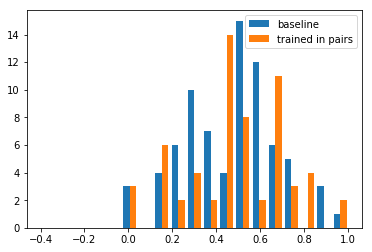

In [24]:

bins = np.linspace(-0.4, 1, 20)

plt.hist([dist_baseline, dist_pair], bins, label=['baseline', 'trained in pairs'])
plt.legend(loc='upper right')
plt.show()

# How much more do the existence probabilities have to move?

In [ ]:
deltprob_baseline = []
deltprob_pair = []

for pair in pairs_tags:
    prob_baseline1 = get_existence_probability(baseline_parameter_dir, pair[0])
    prob_baseline2 = get_existence_probability(baseline_parameter_dir, pair[1])
    deltprob_baseline.append(np.linalg.norm(prob_baseline2 - prob_baseline1))
    
    prob_pair1 = get_existence_probability(pair_parameter_dir, pair[0])
    prob_pair2 = get_existence_probability(pair_parameter_dir, pair[1])
    deltprob_pair.append(np.linalg.norm(prob_pair2 - prob_pair1))
    
    
bins = np.linspace(-0.4, 1, 20)

plt.hist([deltprob_baseline, deltprob_pair], bins, label=['baseline', 'trained in pairs'])
plt.legend(loc='upper right')
plt.show()


# Hungarian

100%|██████████| 200/200 [02:14<00:00,  1.48it/s]


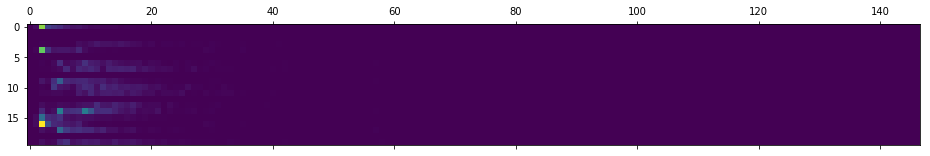

In [29]:
# hungarian
from tqdm import tqdm

total_iou = None
for model in tqdm(models[:200]):
    with open(os.path.join(pair_folder, category_id, model, 'part_IOU.pkl'), 'rb') as f:
        iou_dict = pickle.load(f)
    iou_matrix = iou_dict['indiv_IOU']
    if total_iou is None:
        total_iou = iou_matrix
    else:
        total_iou = total_iou + iou_matrix

plt.matshow(total_iou/len(models))
plt.show()

# step 1:sfind the best superquadidx2partid

In [30]:
total_pair_iou = total_iou

100%|██████████| 200/200 [00:06<00:00, 29.71it/s]


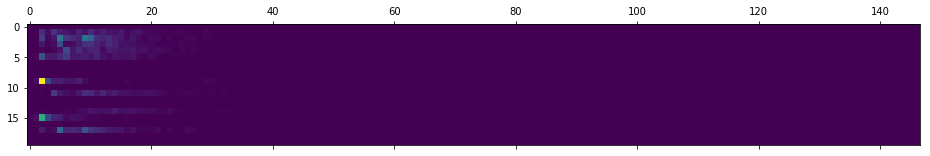

In [31]:
from tqdm import tqdm

total_iou = None
for model in tqdm(models[:200]):
    with open(os.path.join(baseline_folder, category_id, model, 'part_IOU.pkl'), 'rb') as f:
        iou_dict = pickle.load(f)
    iou_matrix = iou_dict['indiv_IOU']
    if total_iou is None:
        total_iou = iou_matrix
    else:
        total_iou = total_iou + iou_matrix

plt.matshow(total_iou/len(models))
plt.show()

In [32]:
total_baseline_iou = total_iou

In [39]:
from metrics import get_consistency

baseline_sum_IOU, baseline_superquadidx2partidx = get_consistency(total_baseline_iou)
pair_sum_IOU, pair_superquadidx2partidx = get_consistency(total_pair_iou)

baseline_superquadidx2partidx= {el[0]: el[1] for el in baseline_superquadidx2partidx}
pair_superquadidx2partidx= {el[0]: el[1] for el in pair_superquadidx2partidx}

In [35]:
print("total baseline sum IOU: {}".format(baseline_sum_IOU) )
print("total sum IOU for paired setting: {}".format(pair_sum_IOU))

total baseline sum IOU: 105.15438831131758
total sum IOU for paired setting: 112.13009247866479


In [42]:
baseline_iou_totals = []
pair_iou_totals = []
for model in tqdm(models[:200]):
    with open(os.path.join(pair_folder, category_id, model, 'part_IOU.pkl'), 'rb') as f:
        iou_dict = pickle.load(f)
    num_superquad = iou_dict['indiv_IOU'].shape[0]
    superquad_idxs = list(range(num_superquad))
    part_idxs = [pair_superquadidx2partidx[i] for i in range(num_superquad)]
    iou_total = np.sum(iou_dict['indiv_IOU'][np.array(superquad_idxs), np.array(part_idxs)])
    
    pair_iou_totals.append(iou_total)
    
    with open(os.path.join(baseline_folder, category_id, model, 'part_IOU.pkl'), 'rb') as f:
        iou_dict = pickle.load(f)
    num_superquad = iou_dict['indiv_IOU'].shape[0]
    superquad_idxs = list(range(num_superquad))
    part_idxs = [baseline_superquadidx2partidx[i] for i in range(num_superquad)]
    iou_total = np.sum(iou_dict['indiv_IOU'][np.array(superquad_idxs), np.array(part_idxs)])
    
    baseline_iou_totals.append(iou_total)

100%|██████████| 200/200 [01:53<00:00,  1.76it/s]


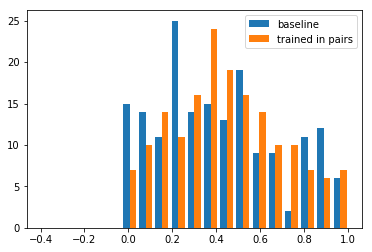

In [43]:

bins = np.linspace(-0.4, 1, 20)

plt.hist([baseline_iou_totals, pair_iou_totals], bins, label=['baseline', 'trained in pairs'])
plt.legend(loc='upper right')
plt.show()